In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/skincancer/skin.v1i.yolov11/README.dataset.txt
/kaggle/input/skincancer/skin.v1i.yolov11/README.roboflow.txt
/kaggle/input/skincancer/skin.v1i.yolov11/data.yaml
/kaggle/input/skincancer/skin.v1i.yolov11/split.py
/kaggle/input/skincancer/skin.v1i.yolov11/val/labels/ISIC_0030971_jpg.rf.66639d490501ddc508813d8fa1278b41.txt
/kaggle/input/skincancer/skin.v1i.yolov11/val/labels/ISIC_0033367_jpg.rf.9483e4775e0b4d0d16266fd6bc3d89d3.txt
/kaggle/input/skincancer/skin.v1i.yolov11/val/labels/ISIC_0029129_jpg.rf.46b546a2b228039776b7f6212b51684a.txt
/kaggle/input/skincancer/skin.v1i.yolov11/val/labels/ISIC_0033988_jpg.rf.a3e25835159d0dfd352dea6410796f4e.txt
/kaggle/input/skincancer/skin.v1i.yolov11/val/labels/ISIC_0029820_jpg.rf.601ce8f6b035547809eae177de2f97d3.txt
/kaggle/input/skincancer/skin.v1i.yolov11/val/labels/ISIC_0030762_jpg.rf.c91cb70c7c47787ea1ab7ead6c4e4abf.txt
/kaggle/input/skincancer/skin.v1i.yolov11/val/labels/ISIC_0027093_jpg.rf.d8690d5bc58dc6620330be8ca8d7b1b0.txt
/kag

In [2]:
# Pip install method (recommended)
%pip install ultralytics
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 876.6/876.6 kB 13.4 MB/s eta 0:00:00a 0:00:01
Note: you may need to restart the kernel to use updated packages.


In [3]:
# Importing the required libraries
from ultralytics import YOLO
import squarify
import matplotlib.pyplot as plt
import cv2
import os
import random
import pandas as pd
import matplotlib.image as mpimg
import seaborn as sns
import torch

sns.set_style('darkgrid')

%matplotlib inline

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


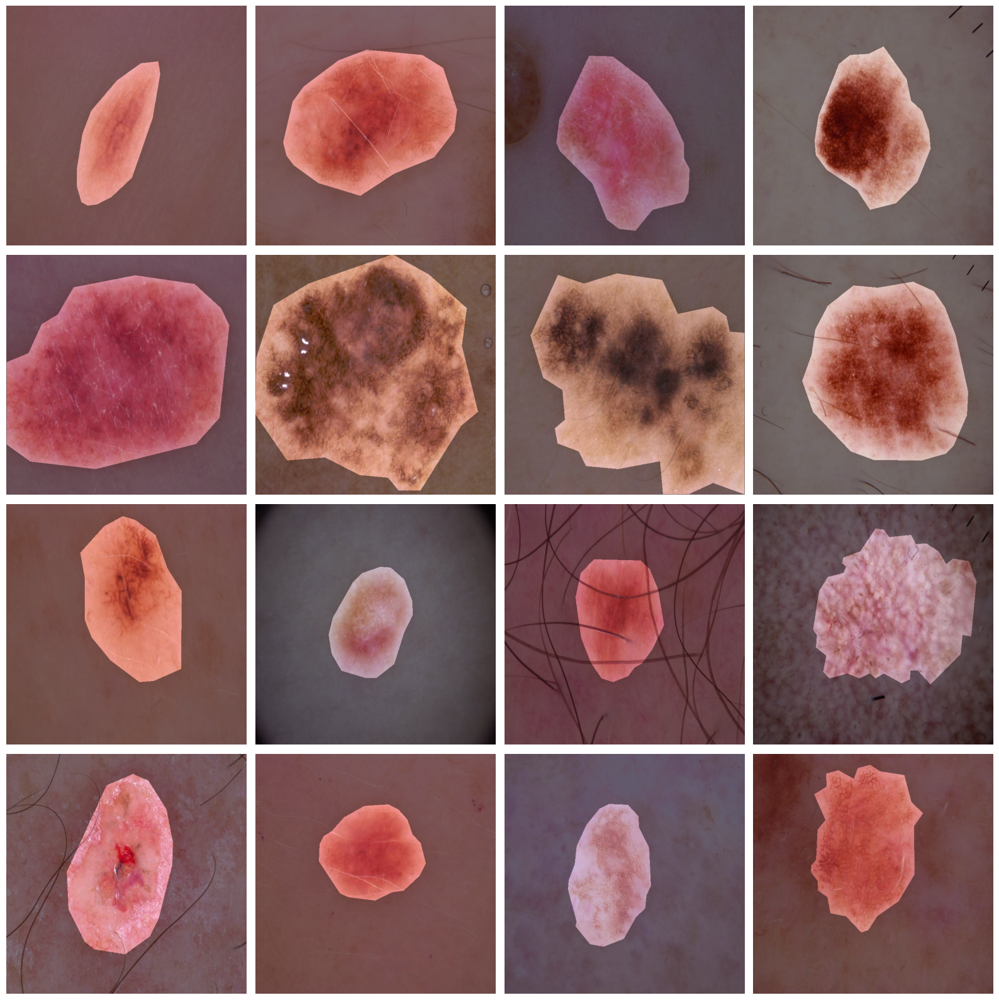

In [4]:
# Define the paths to the images and labels directories
train_images = "/kaggle/input/skincancer/skin.v1i.yolov11/train/images"
train_labels = "/kaggle/input/skincancer/skin.v1i.yolov11/train/labels"

test_images = "/kaggle/input/skincancer/skin.v1i.yolov11/test/images"
test_labels = "/kaggle/input/skincancer/skin.v1i.yolov11/test/labels"

val_images = "/kaggle/input/skincancer/skin.v1i.yolov11/val/images"
val_labels = "/kaggle/input/skincancer/skin.v1i.yolov11/val/labels"

# Get a list of all the image files in the training images directory
image_files = os.listdir(train_images)

# Choose 16 random image files from the list
random_images = random.sample(image_files, 16)

# Set up the plot
fig, axs = plt.subplots(4, 4, figsize=(16, 16))

# Loop over the random images and plot the segmentations
for i, image_file in enumerate(random_images):
    row = i // 4
    col = i % 4
    
    # Load the image
    image_path = os.path.join(train_images, image_file)
    image = cv2.imread(image_path)
    
    # Load the labels for this image
    label_file = os.path.splitext(image_file)[0] + ".txt"
    label_path = os.path.join(train_labels, label_file)
    
    # Create a mask of the same size as the image
    mask = np.zeros(image.shape[:2], dtype=np.uint8)
    
    with open(label_path, "r") as f:
        labels = f.read().strip().split("\n")
    
    # Loop over the labels and create segmentation masks
    for label in labels:
        parts = label.split()
        if len(parts) < 5:  # Skip if not enough data
            continue
        class_id = int(parts[0])
        points = list(map(float, parts[1:]))
        
        # Convert normalized coordinates to pixel coordinates
        points = np.array([(points[i] * image.shape[1], points[i+1] * image.shape[0]) 
                           for i in range(0, len(points), 2)], dtype=np.int32)
        
        # Draw filled polygon on mask
        cv2.fillPoly(mask, [points], color=(255))
    
    # Apply the mask to the image
    segmented = cv2.bitwise_and(image, image, mask=mask)
    
    # Blend the original image with the segmentation
    alpha = 0.5
    blended = cv2.addWeighted(image, alpha, segmented, 1-alpha, 0)
    
    # Show the blended image with the segmentations
    axs[row, col].imshow(cv2.cvtColor(blended, cv2.COLOR_BGR2RGB))
    axs[row, col].axis('off')

plt.tight_layout()
plt.show()

In [5]:
# Load an image using OpenCV
image = cv2.imread("/kaggle/input/skincancer/skin.v1i.yolov11/train/images/ISIC_0024306_jpg.rf.bc954266071188597aea0854864dcf49.jpg")

# Get the size of the image
height, width, channels = image.shape
print(f"The image has dimensions {width}x{height} and {channels} channels.")

The image has dimensions 640x640 and 3 channels.


In [6]:
from ultralytics import YOLO

# Load a COCO-pretrained YOLO11n model
model = YOLO("yolov8s-seg.pt") 

100%|██████████| 22.8M/22.8M [00:00<00:00, 179MB/s]


In [7]:
# free up GPU memory
torch.cuda.empty_cache()

# Train the model
model.train(
    data='/kaggle/input/skincancer/skin.v1i.yolov11/data.yaml',  
    epochs=80,
    imgsz=640,
    optimizer="AdamW",
    lr0=0.001,
    batch=32,
    device='0'                       
)

Ultralytics 8.3.18 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=segment, mode=train, model=yolov8s-seg.pt, data=/kaggle/input/skincancer/skin.v1i.yolov11/data.yaml, epochs=80, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show

100%|██████████| 755k/755k [00:00<00:00, 13.7MB/s]
2024-10-21 10:34:13,003	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-10-21 10:34:13,739	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


Overriding model.yaml nc=80 with nc=7

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1   1180672  ultralytics

wandb: Using wandb-core as the SDK backend. Please refer to https://wandb.me/wandb-core for more information.
wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

  ········


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks with YOLO11n...


100%|██████████| 5.35M/5.35M [00:00<00:00, 64.8MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/input/skincancer/skin.v1i.yolov11/train/labels... 6408 images, 0 backgrounds, 0 corrupt: 100%|██████████| 6408/6408 [00:36<00:00, 173.57it/s]


train: WARNING ⚠️ Cache directory /kaggle/input/skincancer/skin.v1i.yolov11/train is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/opt/conda/lib/python3.10/site-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 1.4.18 (you have 1.4.17). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /kaggle/input/skincancer/skin.v1i.yolov11/val/labels... 801 images, 0 backgrounds, 0 corrupt: 100%|██████████| 801/801 [00:04<00:00, 177.82it/s]

val: WARNING ⚠️ Cache directory /kaggle/input/skincancer/skin.v1i.yolov11/val is not writeable, cache not saved.


Plotting labels to runs/segment/train/labels.jpg... 
optimizer: AdamW(lr=0.001, momentum=0.937) with parameter groups 66 weight(decay=0.0), 77 weight(decay=0.0005), 76 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/segment/train
Starting training for 80 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       1/80      9.37G     0.9338      1.879      1.637      1.311         18        640: 100%|██████████| 201/201 [02:21<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.32it/s]

                   all        801        809      0.378      0.435      0.251      0.153      0.276      0.199      0.105     0.0422



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       2/80       9.3G      0.912      1.582      1.234      1.285         23        640: 100%|██████████| 201/201 [02:19<00:00,  1.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:10<00:00,  1.26it/s]

                   all        801        809       0.34      0.399      0.271       0.15      0.339      0.415      0.299      0.191



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       3/80      9.32G     0.8825      1.522      1.149      1.257         23        640: 100%|██████████| 201/201 [02:18<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.32it/s]

                   all        801        809      0.611      0.385      0.395      0.247      0.635      0.396       0.43      0.285



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       4/80      9.31G     0.8712      1.494      1.146      1.253         18        640: 100%|██████████| 201/201 [02:18<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:10<00:00,  1.29it/s]

                   all        801        809      0.434       0.39      0.305      0.147       0.45      0.395      0.323      0.185



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       5/80      9.28G     0.8443      1.449      1.084      1.233         17        640: 100%|██████████| 201/201 [02:18<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.31it/s]

                   all        801        809      0.434      0.551      0.382       0.26      0.423      0.568      0.396      0.271



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       6/80      9.32G      0.831      1.452      1.074      1.222         20        640: 100%|██████████| 201/201 [02:18<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.34it/s]

                   all        801        809      0.743      0.325      0.413      0.293      0.736      0.327      0.416      0.295



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       7/80      9.29G     0.8076      1.395      1.048      1.208         18        640: 100%|██████████| 201/201 [02:18<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.33it/s]

                   all        801        809      0.671       0.51      0.465       0.31      0.673      0.512      0.461      0.309



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       8/80      9.29G     0.7863      1.386      1.021      1.196         21        640: 100%|██████████| 201/201 [02:18<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.31it/s]

                   all        801        809      0.313      0.613      0.452      0.318      0.311      0.607      0.441      0.317



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       9/80      9.27G     0.7919      1.381      1.002      1.196         19        640: 100%|██████████| 201/201 [02:17<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.32it/s]

                   all        801        809      0.633      0.422      0.408      0.288      0.633       0.42      0.405      0.286



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      10/80       9.3G     0.7621      1.353     0.9937      1.181         24        640: 100%|██████████| 201/201 [02:17<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.33it/s]

                   all        801        809      0.546      0.583      0.508       0.36      0.551      0.587      0.506      0.361



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      11/80       9.3G     0.7866      1.373     0.9974      1.186         21        640: 100%|██████████| 201/201 [02:17<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.34it/s]

                   all        801        809      0.518      0.434        0.4      0.255      0.518      0.434      0.405      0.278



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      12/80      9.36G      0.771      1.351     0.9769      1.177         21        640: 100%|██████████| 201/201 [02:17<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.35it/s]

                   all        801        809      0.519       0.58      0.504      0.356      0.503      0.565       0.49      0.341



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      13/80       9.3G     0.7558      1.339     0.9577      1.178         20        640: 100%|██████████| 201/201 [02:17<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.31it/s]

                   all        801        809      0.447      0.591      0.502      0.376      0.442      0.578      0.493      0.362



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      14/80      9.34G     0.7593      1.333     0.9625      1.175         22        640: 100%|██████████| 201/201 [02:17<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.35it/s]

                   all        801        809      0.662      0.481      0.492      0.361      0.663       0.49      0.495      0.357



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      15/80      9.31G     0.7409      1.318     0.9316      1.163         14        640: 100%|██████████| 201/201 [02:17<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.37it/s]

                   all        801        809      0.415      0.509      0.398      0.248      0.422      0.522       0.41      0.245



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      16/80      9.34G     0.7356      1.298     0.9319      1.163         18        640: 100%|██████████| 201/201 [02:17<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.38it/s]

                   all        801        809      0.411      0.573      0.528      0.397       0.41      0.572      0.526      0.384



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      17/80      9.31G     0.7383      1.292     0.9301      1.162         19        640: 100%|██████████| 201/201 [02:17<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.37it/s]

                   all        801        809      0.593      0.599      0.566      0.407      0.584       0.59      0.544      0.397



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      18/80      9.33G     0.7345      1.307     0.9131      1.162         14        640: 100%|██████████| 201/201 [02:17<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.37it/s]

                   all        801        809      0.355      0.573      0.501      0.372      0.351      0.574      0.496      0.363



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      19/80      9.29G     0.7231      1.281     0.9018      1.152         16        640: 100%|██████████| 201/201 [02:17<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.37it/s]

                   all        801        809      0.539      0.565      0.536      0.402      0.537      0.567      0.535      0.393



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      20/80      9.34G     0.7187       1.28     0.9005       1.15         21        640: 100%|██████████| 201/201 [02:17<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.38it/s]

                   all        801        809      0.615      0.509        0.5      0.343      0.605      0.498      0.487      0.324



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      21/80      9.31G     0.7085      1.272     0.8787      1.145         18        640: 100%|██████████| 201/201 [02:16<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.36it/s]

                   all        801        809      0.584      0.546      0.525      0.369      0.584      0.543      0.523      0.352



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      22/80       9.3G     0.7032      1.262     0.8732      1.135         22        640: 100%|██████████| 201/201 [02:17<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.32it/s]

                   all        801        809      0.513      0.528      0.531      0.382      0.511      0.524      0.525      0.354



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      23/80       9.3G      0.707      1.262     0.8814      1.137         20        640: 100%|██████████| 201/201 [02:18<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.30it/s]

                   all        801        809      0.483      0.661      0.581      0.429      0.476      0.661      0.578      0.417



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      24/80      9.32G     0.6995      1.259     0.8587      1.136         19        640: 100%|██████████| 201/201 [02:17<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.34it/s]

                   all        801        809      0.571      0.624      0.603      0.448      0.571      0.625      0.603      0.435



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      25/80      9.28G     0.7019      1.266     0.8701      1.138         22        640: 100%|██████████| 201/201 [02:17<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.32it/s]

                   all        801        809      0.602      0.582      0.563      0.413      0.608      0.578      0.561        0.4



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      26/80      9.29G     0.6925      1.249      0.851      1.137         26        640: 100%|██████████| 201/201 [02:17<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.33it/s]

                   all        801        809      0.479        0.6      0.568      0.409      0.478      0.599      0.562      0.397



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      27/80      9.27G     0.6878      1.227      0.822      1.126         24        640: 100%|██████████| 201/201 [02:17<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.33it/s]

                   all        801        809      0.479      0.602      0.568      0.417      0.478      0.601      0.567      0.407



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      28/80      9.32G     0.6901      1.225     0.8297      1.131         25        640: 100%|██████████| 201/201 [02:17<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.32it/s]

                   all        801        809      0.627      0.544      0.503       0.38      0.626      0.549      0.512      0.373



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      29/80      9.31G     0.6751      1.205     0.8195      1.123         23        640: 100%|██████████| 201/201 [02:17<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.31it/s]

                   all        801        809      0.599       0.59      0.591      0.432        0.6       0.59      0.591      0.425



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      30/80      9.31G     0.6834      1.222      0.816      1.126         19        640: 100%|██████████| 201/201 [02:17<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.37it/s]

                   all        801        809      0.477      0.584        0.6      0.462      0.472      0.578      0.594      0.448



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      31/80      9.26G     0.6675      1.199     0.7964      1.115         22        640: 100%|██████████| 201/201 [02:17<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.35it/s]

                   all        801        809      0.673      0.579      0.651      0.485      0.673      0.579      0.651      0.477



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      32/80      9.32G     0.6873      1.229     0.8138       1.13         19        640: 100%|██████████| 201/201 [02:17<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.34it/s]

                   all        801        809      0.611      0.565      0.577      0.426       0.58      0.572      0.566        0.4



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      33/80      9.29G     0.6786      1.207     0.8079      1.119         20        640: 100%|██████████| 201/201 [02:17<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.34it/s]

                   all        801        809      0.562      0.643      0.608       0.42      0.563      0.642      0.618      0.417



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      34/80      9.31G     0.6694        1.2     0.7899      1.119         25        640: 100%|██████████| 201/201 [02:17<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.32it/s]

                   all        801        809      0.588      0.681      0.627      0.482      0.592      0.669      0.623      0.472



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      35/80      9.31G     0.6592       1.19     0.7838      1.112         20        640: 100%|██████████| 201/201 [02:17<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.33it/s]

                   all        801        809      0.647      0.606      0.636      0.457      0.647      0.606      0.633      0.457



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      36/80      9.38G     0.6666      1.197     0.7831      1.118         23        640: 100%|██████████| 201/201 [02:17<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.33it/s]

                   all        801        809      0.565       0.66      0.643      0.486      0.565       0.66      0.642       0.48



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      37/80      9.27G     0.6612      1.188     0.7697      1.114         27        640: 100%|██████████| 201/201 [02:17<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.33it/s]

                   all        801        809       0.63      0.564        0.6      0.444      0.631      0.564        0.6      0.427



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      38/80       9.3G     0.6644       1.21     0.7896      1.114         19        640: 100%|██████████| 201/201 [02:17<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.33it/s]

                   all        801        809      0.636      0.673      0.667      0.504      0.637      0.673      0.662      0.489



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      39/80      9.33G     0.6523      1.187     0.7545      1.105         22        640: 100%|██████████| 201/201 [02:17<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.33it/s]

                   all        801        809      0.596      0.681      0.675      0.511      0.596      0.679      0.674      0.495



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      40/80      9.33G     0.6539      1.166     0.7527      1.107         16        640: 100%|██████████| 201/201 [02:17<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.35it/s]

                   all        801        809       0.62      0.651      0.668      0.485      0.639      0.625      0.668      0.479



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      41/80      9.29G     0.6562      1.161     0.7483      1.109         16        640: 100%|██████████| 201/201 [02:17<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.34it/s]

                   all        801        809      0.621      0.645      0.647      0.482      0.604      0.653      0.648      0.467



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      42/80      9.31G     0.6522      1.169     0.7451      1.107         14        640: 100%|██████████| 201/201 [02:17<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.32it/s]

                   all        801        809      0.646      0.663      0.663      0.491      0.648      0.664      0.668       0.48



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      43/80      9.29G     0.6346      1.137     0.7202      1.096         20        640: 100%|██████████| 201/201 [02:17<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.34it/s]

                   all        801        809      0.693      0.575      0.678      0.513      0.694      0.577      0.684      0.507



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      44/80      9.33G     0.6371      1.162     0.7332        1.1         18        640: 100%|██████████| 201/201 [02:17<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.35it/s]

                   all        801        809      0.707      0.623      0.684      0.531      0.706      0.621       0.68      0.525



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      45/80      9.31G     0.6463      1.171     0.7365      1.104         13        640: 100%|██████████| 201/201 [02:17<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.32it/s]

                   all        801        809      0.651      0.665      0.672       0.52      0.651      0.666      0.672      0.506



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      46/80      9.34G     0.6359      1.155     0.7215      1.096         25        640: 100%|██████████| 201/201 [02:17<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.34it/s]

                   all        801        809      0.625      0.684      0.693      0.537      0.625      0.684      0.693      0.525



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      47/80      9.27G      0.636      1.161     0.7145      1.097         20        640: 100%|██████████| 201/201 [02:18<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.35it/s]

                   all        801        809      0.702      0.619      0.699      0.538      0.707      0.621      0.698      0.531



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      48/80      9.32G       0.63      1.141     0.7085      1.089         18        640: 100%|██████████| 201/201 [02:17<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.34it/s]

                   all        801        809      0.689      0.692      0.719      0.544      0.689      0.692      0.719       0.53



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      49/80      9.29G     0.6285      1.135     0.6947      1.092         22        640: 100%|██████████| 201/201 [02:17<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.35it/s]

                   all        801        809      0.638      0.688       0.72       0.54      0.644      0.697      0.725      0.528



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      50/80      9.28G     0.6246      1.133     0.6917      1.091         21        640: 100%|██████████| 201/201 [02:17<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.32it/s]

                   all        801        809      0.674       0.66      0.714      0.543      0.658       0.65      0.701      0.528



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      51/80      9.29G     0.6211      1.132     0.6936      1.088         23        640: 100%|██████████| 201/201 [02:18<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.33it/s]

                   all        801        809      0.669      0.657      0.713      0.536      0.667       0.66       0.71      0.523



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      52/80      9.35G     0.6196      1.121     0.6731      1.083         15        640: 100%|██████████| 201/201 [02:18<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.33it/s]

                   all        801        809      0.658      0.708      0.731      0.558      0.654       0.71      0.735      0.546



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      53/80      9.29G     0.6149      1.105     0.6713      1.084         26        640: 100%|██████████| 201/201 [02:18<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.33it/s]

                   all        801        809      0.718      0.635      0.708      0.551      0.711      0.631      0.706      0.536



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      54/80      9.32G     0.6091      1.109      0.666       1.08         24        640: 100%|██████████| 201/201 [02:17<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.34it/s]

                   all        801        809      0.646      0.707      0.717       0.55      0.646       0.71      0.719      0.538



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      55/80      9.25G     0.6088      1.113     0.6619      1.078         20        640: 100%|██████████| 201/201 [02:17<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.33it/s]

                   all        801        809      0.673      0.732      0.733      0.564      0.671      0.733      0.727      0.547



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      56/80      9.33G     0.6065      1.102     0.6489      1.077         21        640: 100%|██████████| 201/201 [02:17<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.31it/s]

                   all        801        809      0.646       0.73      0.744      0.564      0.651      0.736       0.75      0.557



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      57/80      9.33G      0.611      1.105     0.6464      1.081         17        640: 100%|██████████| 201/201 [02:17<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.34it/s]

                   all        801        809      0.683      0.727      0.724      0.562      0.691      0.737      0.732      0.545



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      58/80      9.36G     0.6023      1.106     0.6499      1.079         23        640: 100%|██████████| 201/201 [02:17<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.32it/s]

                   all        801        809      0.711      0.642      0.709      0.543      0.705      0.645        0.7      0.527



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      59/80      9.28G     0.5977      1.105     0.6342      1.072         17        640: 100%|██████████| 201/201 [02:17<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.33it/s]

                   all        801        809      0.815      0.605      0.727      0.566       0.77      0.626      0.735      0.552



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      60/80      9.28G     0.5943      1.085     0.6279      1.068         19        640: 100%|██████████| 201/201 [02:17<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.34it/s]

                   all        801        809       0.72      0.652      0.724      0.567       0.72      0.652      0.724      0.548



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      61/80      9.32G     0.5902      1.079     0.6174      1.067         20        640: 100%|██████████| 201/201 [02:17<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.31it/s]

                   all        801        809      0.672      0.752      0.742      0.555      0.676      0.766      0.744      0.547



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      62/80      9.32G     0.5858      1.078     0.6122       1.07         16        640: 100%|██████████| 201/201 [02:17<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.34it/s]

                   all        801        809      0.752      0.622       0.72      0.566      0.692      0.682      0.726      0.558



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      63/80      9.22G     0.5927      1.083     0.6068      1.068         25        640: 100%|██████████| 201/201 [02:17<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.34it/s]

                   all        801        809      0.714       0.68      0.734      0.561      0.704      0.683      0.726      0.543



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      64/80       9.3G     0.5943      1.084     0.6138      1.071         19        640: 100%|██████████| 201/201 [02:17<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.33it/s]

                   all        801        809      0.793      0.683      0.762      0.581      0.785       0.68      0.755      0.566



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      65/80      9.29G     0.5823      1.075     0.6054      1.068         21        640: 100%|██████████| 201/201 [02:17<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.36it/s]

                   all        801        809      0.758      0.686      0.763      0.578      0.751      0.683      0.755       0.57



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      66/80      9.31G     0.5817      1.073      0.596      1.064         20        640: 100%|██████████| 201/201 [02:17<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.34it/s]

                   all        801        809      0.766      0.701      0.772      0.598       0.76      0.697       0.77      0.584



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      67/80      9.32G     0.5833      1.082     0.6014      1.064         23        640: 100%|██████████| 201/201 [02:17<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.35it/s]

                   all        801        809      0.767      0.708      0.767      0.587       0.77      0.697      0.769      0.578



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      68/80       9.3G     0.5731      1.055     0.5807      1.053         23        640: 100%|██████████| 201/201 [02:17<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.37it/s]

                   all        801        809      0.767      0.681      0.753      0.578      0.735      0.703      0.752      0.566



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      69/80      9.31G     0.5851       1.07     0.5909      1.067         25        640: 100%|██████████| 201/201 [02:17<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.34it/s]

                   all        801        809      0.705      0.747      0.783      0.596      0.696      0.744      0.772      0.581



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      70/80      9.35G     0.5681      1.051     0.5766      1.053         24        640: 100%|██████████| 201/201 [02:17<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.35it/s]

                   all        801        809      0.797      0.718       0.79      0.605      0.785      0.707      0.781      0.584


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      71/80      9.21G     0.4398     0.8324     0.4026       1.03          9        640: 100%|██████████| 201/201 [02:18<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.35it/s]

                   all        801        809      0.696      0.775      0.762      0.601      0.703      0.785       0.77      0.585



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      72/80      9.24G     0.4292     0.8225     0.3754       1.02          8        640: 100%|██████████| 201/201 [02:16<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.34it/s]

                   all        801        809      0.661      0.775      0.761      0.591      0.665      0.779      0.763      0.576



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      73/80      9.21G      0.428     0.8165     0.3631      1.018          8        640: 100%|██████████| 201/201 [02:16<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.36it/s]

                   all        801        809      0.749      0.699      0.766      0.592      0.678      0.788      0.761      0.584



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      74/80      9.24G     0.4213     0.8042     0.3587      1.009          8        640: 100%|██████████| 201/201 [02:16<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.33it/s]

                   all        801        809      0.713      0.728      0.762       0.59      0.708      0.724      0.757      0.578



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      75/80      9.23G     0.4163     0.8045     0.3527       1.01          8        640: 100%|██████████| 201/201 [02:16<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.35it/s]

                   all        801        809      0.697      0.739      0.759      0.584      0.696       0.74      0.751      0.572



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      76/80      9.25G     0.4139       0.79     0.3502      1.002          8        640: 100%|██████████| 201/201 [02:16<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.36it/s]

                   all        801        809      0.686      0.763      0.768       0.59       0.69      0.768      0.768      0.576



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      77/80      9.23G     0.4096     0.7915     0.3333     0.9989          8        640: 100%|██████████| 201/201 [02:16<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.34it/s]

                   all        801        809      0.696      0.764      0.763      0.583      0.684      0.763      0.753      0.571



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      78/80      9.24G      0.402     0.7798     0.3185     0.9898          8        640: 100%|██████████| 201/201 [02:16<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.37it/s]

                   all        801        809      0.739      0.741      0.772      0.592      0.733      0.737      0.762      0.584



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      79/80      9.21G     0.3957     0.7788     0.3195     0.9926          8        640: 100%|██████████| 201/201 [02:16<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.33it/s]

                   all        801        809      0.717      0.736      0.766      0.584      0.711      0.732      0.759      0.576



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      80/80      9.24G     0.3953     0.7758     0.3194     0.9863          8        640: 100%|██████████| 201/201 [02:16<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.35it/s]

                   all        801        809      0.731       0.74      0.772      0.593      0.731      0.748       0.77      0.581



80 epochs completed in 3.303 hours.
Optimizer stripped from runs/segment/train/weights/last.pt, 23.9MB
Optimizer stripped from runs/segment/train/weights/best.pt, 23.9MB

Validating runs/segment/train/weights/best.pt...
Ultralytics 8.3.18 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8s-seg summary (fused): 195 layers, 11,782,309 parameters, 0 gradients, 42.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:10<00:00,  1.21it/s]


                   all        801        809      0.796      0.719      0.791      0.606      0.786      0.707      0.782      0.584
                 AKIEC         34         34      0.903       0.55      0.757      0.478        0.8      0.471      0.686      0.418
                   BCC         30         30      0.631        0.7      0.625      0.387      0.636        0.7      0.643      0.371
                   BKL         88         88      0.668      0.807      0.815      0.649      0.682      0.807      0.809      0.623
                    DF          8          8      0.905      0.625      0.735      0.472      0.912      0.625      0.735      0.478
                   MEL         85         86      0.646      0.535      0.676        0.6      0.648      0.535      0.676       0.59
                    NV        554        554      0.933       0.94      0.963      0.875      0.934      0.941      0.963       0.87
                  VASC          9          9      0.887      0.874   

lr/pg0,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr/pg1,▃▆███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▅▅▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▁▁
lr/pg2,▃▆█████▇▇▇▇▇▆▆▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▂▂▂▁▁▁
metrics/mAP50(B),▂▁▂▃▃▄▂▄▄▂▄▄▄▅▅▄▅▆▆▆▆▇▇▇▇▇▇▇▇▇███▇██████
metrics/mAP50(M),▁▃▅▅▄▅▅▆▅▅▆▆▆▇▆▇▇▇▇▇▇█▇▇▇█▇█████████████
metrics/mAP50-95(B),▂▂▂▃▃▁▃▄▃▄▅▄▄▆▄▅▅▆▆▆▇▇▇▇▇▇▇▇▇▇█▇██▇█████
metrics/mAP50-95(M),▁▃▄▄▄▄▅▄▅▄▆▆▅▆▆▆▅▆▇▆▆▇▇▆▇▇▇▇█▇██████████
metrics/precision(B),▂▁▅▂▇▅▄▂▄▅▃▅▅▃▅▆▅▅▅▅▆▅▆▆▆▆▆▆█▇▇▇█▇▇▆▇▆▆█
metrics/precision(M),▁▃▃▇▆▃▆▃▃▅▅▆▄▄▄▆▆▅▅▅▆▆▇▆▇▆▆▇▆▇██▇▇▇▇▇▇▇█
metrics/recall(B),▂▂▁▅▃▅▃▄▅▅▄▆▅▅▆▅▆▆▆▆▇▇▆▆▇▇▆█▆▇▇▇█▇█▇██▇▇
metrics/recall(M),▁▄▃▅▃▄▆▅▅▅▆▆▆▆▅▇▇▅▇▇▆▆▆▇▆▇▇▇▆▆▇▇▇▇▇█▇▇█▇


ultralytics.utils.metrics.SegmentMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5, 6])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x798a405021d0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)', 'Precision-Recall(M)', 'F1-Confidence(M)', 'Precision-Confidence(M)', 'Recall-Confidence(M)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04

In [8]:
%matplotlib inline
# Loading the best performing model
model = YOLO('/kaggle/working/runs/segment/train/weights/best.pt')

# Evaluating the model on the test dataset
metrics = model.val(conf = 0.25, split = 'test')

Ultralytics 8.3.18 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8s-seg summary (fused): 195 layers, 11,782,309 parameters, 0 gradients, 42.5 GFLOPs


val: Scanning /kaggle/input/skincancer/skin.v1i.yolov11/test/labels... 801 images, 0 backgrounds, 0 corrupt: 100%|██████████| 801/801 [00:04<00:00, 169.75it/s]


val: WARNING ⚠️ Cache directory /kaggle/input/skincancer/skin.v1i.yolov11/test is not writeable, cache not saved.


/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:15<00:00,  3.20it/s]


                   all        801        804      0.785       0.72      0.802      0.644      0.785       0.72      0.802      0.639
                 AKIEC         19         19      0.866      0.343      0.609      0.478      0.866      0.343      0.609      0.417
                   BCC         30         30        0.7      0.701      0.785      0.472        0.7      0.701      0.785      0.481
                   BKL        107        107      0.761      0.794      0.829      0.668      0.761      0.794      0.832      0.665
                    DF          8          8      0.611       0.75      0.761      0.608      0.611       0.75      0.761      0.618
                   MEL         85         85       0.72      0.604      0.723      0.648       0.72      0.604      0.723      0.647
                    NV        543        543      0.919      0.934      0.957      0.886      0.917      0.932      0.956      0.874
                  VASC         12         12      0.917      0.917   

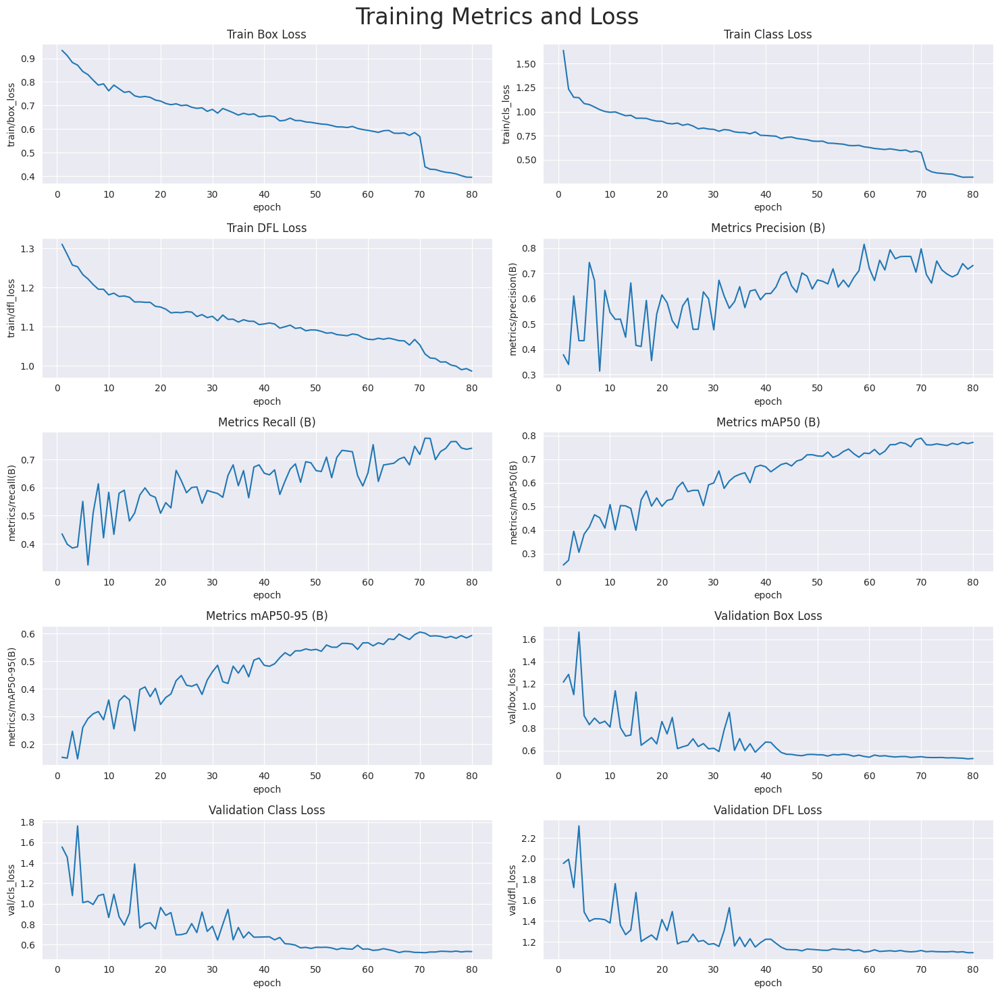

In [9]:
%matplotlib inline
# read in the results.csv file as a pandas dataframe
df = pd.read_csv('/kaggle/working/runs/segment/train/results.csv')
df.columns = df.columns.str.strip()

# create subplots using seaborn
fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 15))

# plot the columns using seaborn
sns.lineplot(x='epoch', y='train/box_loss', data=df, ax=axs[0,0])
sns.lineplot(x='epoch', y='train/cls_loss', data=df, ax=axs[0,1])
sns.lineplot(x='epoch', y='train/dfl_loss', data=df, ax=axs[1,0])
sns.lineplot(x='epoch', y='metrics/precision(B)', data=df, ax=axs[1,1])
sns.lineplot(x='epoch', y='metrics/recall(B)', data=df, ax=axs[2,0])
sns.lineplot(x='epoch', y='metrics/mAP50(B)', data=df, ax=axs[2,1])
sns.lineplot(x='epoch', y='metrics/mAP50-95(B)', data=df, ax=axs[3,0])
sns.lineplot(x='epoch', y='val/box_loss', data=df, ax=axs[3,1])
sns.lineplot(x='epoch', y='val/cls_loss', data=df, ax=axs[4,0])
sns.lineplot(x='epoch', y='val/dfl_loss', data=df, ax=axs[4,1])

# set titles and axis labels for each subplot
axs[0,0].set(title='Train Box Loss')
axs[0,1].set(title='Train Class Loss')
axs[1,0].set(title='Train DFL Loss')
axs[1,1].set(title='Metrics Precision (B)')
axs[2,0].set(title='Metrics Recall (B)')
axs[2,1].set(title='Metrics mAP50 (B)')
axs[3,0].set(title='Metrics mAP50-95 (B)')
axs[3,1].set(title='Validation Box Loss')
axs[4,0].set(title='Validation Class Loss')
axs[4,1].set(title='Validation DFL Loss')

# add suptitle and subheader
plt.suptitle('Training Metrics and Loss', fontsize=24)

# adjust top margin to make space for suptitle
plt.subplots_adjust(top=0.8)

# adjust spacing between subplots
plt.tight_layout()

plt.show()

In [10]:
# Function to perform ship detections
def ship_detect(img_path):
    
    # Read the image
    img = cv2.imread(img_path)

    # Pass the image through the detection model and get the result
    detect_result = model(img)

    # Plot the detections
    detect_img = detect_result[0].plot()
    
    # Convert the image to RGB format
    detect_img = cv2.cvtColor(detect_img, cv2.COLOR_BGR2RGB)
    
    return detect_img


0: 640x640 1 NV, 27.1ms
Speed: 2.9ms preprocess, 27.1ms inference, 4.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 NV, 27.2ms
Speed: 3.0ms preprocess, 27.2ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 NV, 27.1ms
Speed: 3.2ms preprocess, 27.1ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 NV, 27.1ms
Speed: 3.0ms preprocess, 27.1ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 BCC, 24.8ms
Speed: 3.1ms preprocess, 24.8ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 BKL, 1 MEL, 23.9ms
Speed: 3.1ms preprocess, 23.9ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 NV, 23.8ms
Speed: 1.7ms preprocess, 23.8ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 BCC, 23.8ms
Speed: 1.8ms preprocess, 23.8ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 

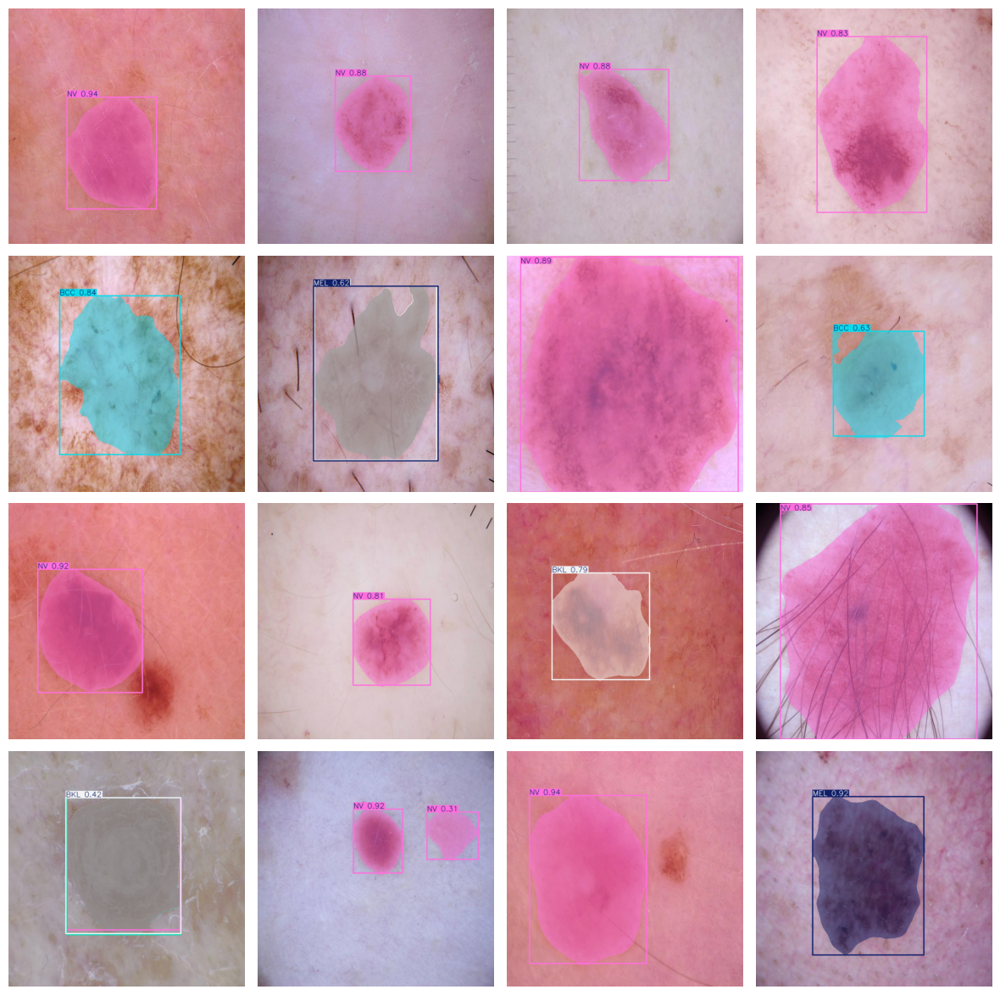

In [11]:
import random

# Define the directory where the custom images are stored
custom_image_dir = '/kaggle/input/skincancer/skin.v1i.yolov11/test/images'

# Get the list of image files in the directory
image_files = os.listdir(custom_image_dir)

# Select 16 random images from the list
selected_images = random.sample(image_files, 16)

# Create a figure with subplots for each image
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(15, 15))

# Iterate over the selected images and plot each one
for i, img_file in enumerate(selected_images):
    
    # Compute the row and column index of the current subplot
    row_idx = i // 4
    col_idx = i % 4
    
    # Load the current image and run object detection
    img_path = os.path.join(custom_image_dir, img_file)
    detect_img = ship_detect(img_path)
    
    # Plot the current image on the appropriate subplot
    axes[row_idx, col_idx].imshow(detect_img)
    axes[row_idx, col_idx].axis('off')

# Adjust the spacing between the subplots
plt.subplots_adjust(wspace=0.05, hspace=0.05)

In [12]:

# Path to your trained model weights
model_weights_path = '/kaggle/working/runs/segment/train/weights/best.pt'

# Load the trained YOLO model
trained_model = YOLO(model_weights_path)

# Path to your test images directory (assuming all images are directly in this folder)
test_images_path = '/kaggle/input/skincancer/skin.v1i.yolov11/test/images'

# Perform predictions on all images in the test folder
predictions = trained_model.predict(
    source=test_images_path,
    conf=0.25,  # Confidence threshold
    save_txt=True,  # Save predictions as text files
    save_conf=True  # Save confidence scores
)

# Output predictions
print('Predictions:', predictions)



image 1/801 /kaggle/input/skincancer/skin.v1i.yolov11/test/images/ISIC_0024307_jpg.rf.27e543b324676c71a6bdd91256abf399.jpg: 640x640 1 NV, 27.1ms
image 2/801 /kaggle/input/skincancer/skin.v1i.yolov11/test/images/ISIC_0024308_jpg.rf.c9259576bf8103b3f988aa95f9da0c37.jpg: 640x640 1 NV, 27.0ms
image 3/801 /kaggle/input/skincancer/skin.v1i.yolov11/test/images/ISIC_0024316_jpg.rf.a1e2d69a36d303e9dad85aa1639c36a5.jpg: 640x640 1 NV, 26.6ms
image 4/801 /kaggle/input/skincancer/skin.v1i.yolov11/test/images/ISIC_0024342_jpg.rf.db30e538ec17cdca2f8074bcd236a260.jpg: 640x640 1 NV, 26.6ms
image 5/801 /kaggle/input/skincancer/skin.v1i.yolov11/test/images/ISIC_0024352_jpg.rf.ace6d8e5136b7386fde01b99442c1807.jpg: 640x640 1 MEL, 26.6ms
image 6/801 /kaggle/input/skincancer/skin.v1i.yolov11/test/images/ISIC_0024377_jpg.rf.4bf21ed8dd71d8ecd350f428eaef87de.jpg: 640x640 2 NVs, 26.6ms
image 7/801 /kaggle/input/skincancer/skin.v1i.yolov11/test/images/ISIC_0024381_jpg.rf.cd0276735ad792e7e6d99f84de981aa4.jpg: 640


image 1/1 /kaggle/input/skincancer/skin.v1i.yolov11/test/images/ISIC_0026683_jpg.rf.75d056ab609e257bd8edb275fadb97a3.jpg: 640x640 1 NV, 13.1ms
Speed: 2.3ms preprocess, 13.1ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/segment/predict
796 labels saved to runs/segment/predict/labels
Prediction result: [ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'AKIEC', 1: 'BCC', 2: 'BKL', 3: 'DF', 4: 'MEL', 5: 'NV', 6: 'VASC'}
obb: None
orig_img: array([[[168, 156, 244],
        [167, 155, 243],
        [167, 155, 243],
        ...,
        [166, 153, 233],
        [166, 153, 233],
        [166, 153, 233]],

       [[167, 155, 243],
        [167, 155, 243],
        [166, 154, 242],
        ...,
        [166, 153, 233],
        [166, 153, 233],
        [167, 154, 234]],

       [[166, 154, 242],
        [166, 154, 242],
    

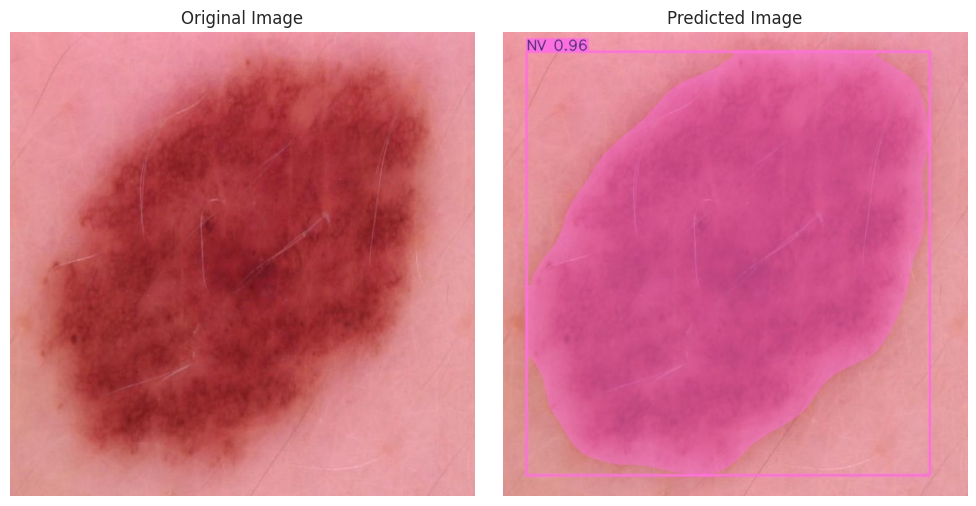

In [13]:
import random
import os
import cv2
import matplotlib.pyplot as plt

# Path to the test images directory
test_images_path = '/kaggle/input/skincancer/skin.v1i.yolov11/test/images'

# Get a list of all image file names in the test folder
image_files = [f for f in os.listdir(test_images_path) if os.path.isfile(os.path.join(test_images_path, f))]

# Randomly select one image from the test folder
random_image_name = random.choice(image_files)
random_image_path = os.path.join(test_images_path, random_image_name)

# Perform prediction on the randomly selected image
result = trained_model.predict(source=random_image_path, conf=0.25, save=True, save_txt=True, save_conf=True)

# Print the result object to find out where YOLO saves the prediction
print("Prediction result:", result)

# YOLO outputs predictions in its result object. Let's inspect that to find the correct folder.
output_dir = result[0].save_dir  # Access the directory where predictions are saved

print(f"YOLO saved predictions in: {output_dir}")

# Construct the predicted image path from the output directory and random image name
predicted_image_path = os.path.join(output_dir, random_image_name)

# Check if the predicted image exists and load it
if os.path.exists(predicted_image_path):
    # Load the predicted image
    predicted_image = cv2.imread(predicted_image_path)
    predicted_image = cv2.cvtColor(predicted_image, cv2.COLOR_BGR2RGB)
else:
    print(f"Predicted image not found at {predicted_image_path}")
    predicted_image = None

# Load the original image
original_image = cv2.imread(random_image_path)
original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for plotting

# Plot the original and predicted images side by side
plt.figure(figsize=(10, 5))

# Show the original image
plt.subplot(1, 2, 1)
plt.imshow(original_image)
plt.title('Original Image')
plt.axis('off')

# Show the predicted image if available
if predicted_image is not None:
    plt.subplot(1, 2, 2)
    plt.imshow(predicted_image)
    plt.title('Predicted Image')
    plt.axis('off')

# Display the images
plt.tight_layout()
plt.show()



image 1/1 /kaggle/input/skincancer/skin.v1i.yolov11/test/images/ISIC_0030000_jpg.rf.b2c4f163cde377997e3331e24580d90f.jpg: 640x640 1 NV, 13.0ms
Speed: 1.7ms preprocess, 13.0ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/segment/predict
796 labels saved to runs/segment/predict/labels
Prediction result: [ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'AKIEC', 1: 'BCC', 2: 'BKL', 3: 'DF', 4: 'MEL', 5: 'NV', 6: 'VASC'}
obb: None
orig_img: array([[[189, 173, 244],
        [185, 169, 240],
        [182, 166, 237],
        ...,
        [154, 141, 217],
        [155, 142, 218],
        [157, 144, 220]],

       [[189, 173, 244],
        [186, 170, 241],
        [183, 167, 238],
        ...,
        [157, 144, 220],
        [158, 145, 221],
        [158, 145, 221]],

       [[188, 171, 244],
        [186, 169, 242],
    

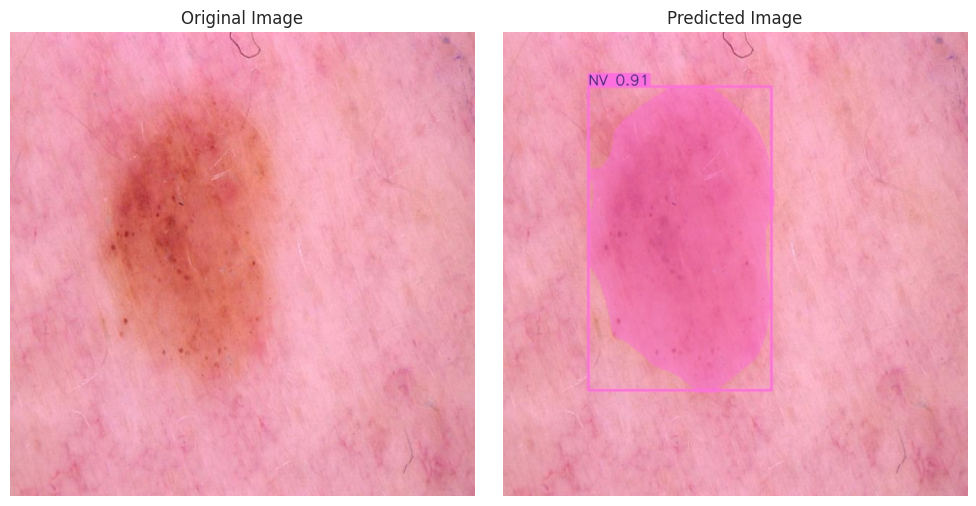

In [14]:
import random
import os
import cv2
import matplotlib.pyplot as plt

# Path to the test images directory
test_images_path = '/kaggle/input/skincancer/skin.v1i.yolov11/test/images'

# Get a list of all image file names in the test folder
image_files = [f for f in os.listdir(test_images_path) if os.path.isfile(os.path.join(test_images_path, f))]

# Randomly select one image from the test folder
random_image_name = random.choice(image_files)
random_image_path = os.path.join(test_images_path, random_image_name)

# Perform prediction on the randomly selected image
result = trained_model.predict(source=random_image_path, conf=0.25, save=True, save_txt=True, save_conf=True)

# Print the result object to find out where YOLO saves the prediction
print("Prediction result:", result)

# YOLO outputs predictions in its result object. Let's inspect that to find the correct folder.
output_dir = result[0].save_dir  # Access the directory where predictions are saved

print(f"YOLO saved predictions in: {output_dir}")

# Construct the predicted image path from the output directory and random image name
predicted_image_path = os.path.join(output_dir, random_image_name)

# Check if the predicted image exists and load it
if os.path.exists(predicted_image_path):
    # Load the predicted image
    predicted_image = cv2.imread(predicted_image_path)
    predicted_image = cv2.cvtColor(predicted_image, cv2.COLOR_BGR2RGB)
else:
    print(f"Predicted image not found at {predicted_image_path}")
    predicted_image = None

# Load the original image
original_image = cv2.imread(random_image_path)
original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for plotting

# Plot the original and predicted images side by side
plt.figure(figsize=(10, 5))

# Show the original image
plt.subplot(1, 2, 1)
plt.imshow(original_image)
plt.title('Original Image')
plt.axis('off')

# Show the predicted image if available
if predicted_image is not None:
    plt.subplot(1, 2, 2)
    plt.imshow(predicted_image)
    plt.title('Predicted Image')
    plt.axis('off')

# Display the images
plt.tight_layout()
plt.show()



image 1/1 /kaggle/input/skincancer/skin.v1i.yolov11/test/images/ISIC_0031757_jpg.rf.351a878c0dc0966ee692f20ae3d8106b.jpg: 640x640 1 NV, 27.2ms
Speed: 2.0ms preprocess, 27.2ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/segment/predict
796 labels saved to runs/segment/predict/labels
Prediction result: [ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'AKIEC', 1: 'BCC', 2: 'BKL', 3: 'DF', 4: 'MEL', 5: 'NV', 6: 'VASC'}
obb: None
orig_img: array([[[  9,   7,  13],
        [ 10,   8,  14],
        [ 11,   9,  15],
        ...,
        [ 87,  87, 103],
        [ 85,  86, 100],
        [ 83,  84,  98]],

       [[  9,   7,  13],
        [ 10,   8,  14],
        [ 11,   9,  15],
        ...,
        [ 88,  88, 104],
        [ 86,  87, 101],
        [ 84,  85,  99]],

       [[  9,   7,  13],
        [ 10,   8,  14],
    

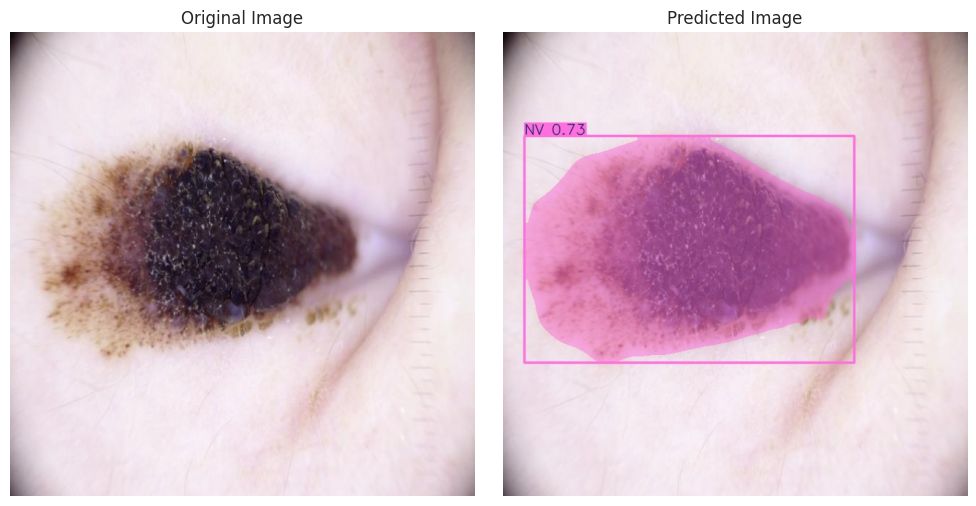

In [15]:
import random
import os
import cv2
import matplotlib.pyplot as plt

# Path to the test images directory
test_images_path = '/kaggle/input/skincancer/skin.v1i.yolov11/test/images'

# Get a list of all image file names in the test folder
image_files = [f for f in os.listdir(test_images_path) if os.path.isfile(os.path.join(test_images_path, f))]

# Randomly select one image from the test folder
random_image_name = random.choice(image_files)
random_image_path = os.path.join(test_images_path, random_image_name)

# Perform prediction on the randomly selected image
result = trained_model.predict(source=random_image_path, conf=0.25, save=True, save_txt=True, save_conf=True)

# Print the result object to find out where YOLO saves the prediction
print("Prediction result:", result)

# YOLO outputs predictions in its result object. Let's inspect that to find the correct folder.
output_dir = result[0].save_dir  # Access the directory where predictions are saved

print(f"YOLO saved predictions in: {output_dir}")

# Construct the predicted image path from the output directory and random image name
predicted_image_path = os.path.join(output_dir, random_image_name)

# Check if the predicted image exists and load it
if os.path.exists(predicted_image_path):
    # Load the predicted image
    predicted_image = cv2.imread(predicted_image_path)
    predicted_image = cv2.cvtColor(predicted_image, cv2.COLOR_BGR2RGB)
else:
    print(f"Predicted image not found at {predicted_image_path}")
    predicted_image = None

# Load the original image
original_image = cv2.imread(random_image_path)
original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for plotting

# Plot the original and predicted images side by side
plt.figure(figsize=(10, 5))

# Show the original image
plt.subplot(1, 2, 1)
plt.imshow(original_image)
plt.title('Original Image')
plt.axis('off')

# Show the predicted image if available
if predicted_image is not None:
    plt.subplot(1, 2, 2)
    plt.imshow(predicted_image)
    plt.title('Predicted Image')
    plt.axis('off')

# Display the images
plt.tight_layout()
plt.show()


In [16]:
import shutil

# Define the path to the 'train' directory
train_dir = '/kaggle/working/runs/segment/train'

# Define the output path for the ZIP file (excluding the '.zip' extension)
output_path = '/kaggle/working/train_archive'

# Create the ZIP archive
shutil.make_archive(output_path, 'zip', train_dir)



'/kaggle/working/train_archive.zip'